<div>
<img src=https://www.institutedata.com/wp-content/uploads/2019/10/iod_h_tp_primary_c.svg width="300">
</div>

# Lab 6.4 - PCA Lab

**In this lab, we will:**
- Explore how PCA is related to correlation.
- Use PCA to perform dimensionality reduction.

# Load Data

Features are computed from a digitized image of a fine needle aspirate (FNA) of a breast mass. They describe characteristics of the cell nuclei present in the image. n the 3-dimensional space is that described in: [K. P. Bennett and O. L. Mangasarian: "Robust Linear Programming Discrimination of Two Linearly Inseparable Sets", Optimization Methods and Software 1, 1992, 23-34].

This database is also available through the UW CS ftp server: ftp ftp.cs.wisc.edu cd math-prog/cpo-dataset/machine-learn/WDBC/

Also can be found on UCI Machine Learning Repository: https://archive.ics.uci.edu/ml/datasets/Breast+Cancer+Wisconsin+%28Diagnostic%29

Attribute Information:

1) ID number 2) Diagnosis (M = malignant, B = benign) 3-32)

Ten real-valued features are computed for each cell nucleus:

a) radius (mean of distances from center to points on the perimeter) b) texture (standard deviation of gray-scale values) c) perimeter d) area e) smoothness (local variation in radius lengths) f) compactness (perimeter^2 / area - 1.0) g) concavity (severity of concave portions of the contour) h) concave points (number of concave portions of the contour) i) symmetry j) fractal dimension ("coastline approximation" - 1)

The mean, standard error and "worst" or largest (mean of the three largest values) of these features were computed for each image, resulting in 30 features. For instance, field 3 is Mean Radius, field 13 is Radius SE, field 23 is Worst Radius.

All feature values are recoded with four significant digits.

Missing attribute values: none

Class distribution: 357 benign, 212 malignant

In [53]:
# IMPORT LIBRARIES
import numpy as np
import pandas as pd

import pandas as pd
import numpy as np
import math
import seaborn as sns
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
from scipy import stats
from sklearn import datasets
from sklearn.datasets import make_circles
from sklearn.cluster import KMeans
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import NearestNeighbors
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [5]:
bc = pd.read_csv('../DATA/breast-cancer-wisconsin-data.csv')
bc

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,NaN
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,NaN
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,NaN
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,NaN


In [6]:
bc.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


# EDA 

Explore dataset. Clean data. Find correlation. 

In [7]:
bc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [8]:
bc.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,0.0
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,NaN
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,NaN
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,NaN
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,NaN
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,NaN
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,NaN
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,NaN


In [12]:
bc.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'Unnamed: 32'],
      dtype='object')

In [13]:
bc.isnull().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

In [14]:
bc = bc.drop(columns=['Unnamed: 32'])

In [15]:
def outlier_filter(data, no_std_dev = 3):
    '''
    return DF with outlier more than 3x of variance removed
    '''
    for col in data.columns:
        if data[col].dtype == 'float64':
            stand = data[col].std()
            mean = data[col].mean()
            upper_lim = mean + no_std_dev*stand
            lower_lim = mean -no_std_dev*stand
            data[col] = data[col].apply(lambda x: np.nan if x > upper_lim or x < lower_lim else x)
    result = data.dropna()
    return result
bc = outlier_filter(bc)

# Subset & Normalize

Subset the data to only include all columns except diagnosis. We will be comparing the principal components to age specifically, so we are leaving age out.

In [21]:
# ANSWER
feat = bc.columns[2:]
bc_feat=bc[feat]

In [56]:
ss = StandardScaler()
bc_feat_ss = ss.fit_transform(bc_feat)

# Calculate correlation matrix

We will be using the correlation matrix to calculate the eigenvectors and eigenvalues.

In [22]:
# ANSWER
corr_feat = bc_feat.corr()

<AxesSubplot:>

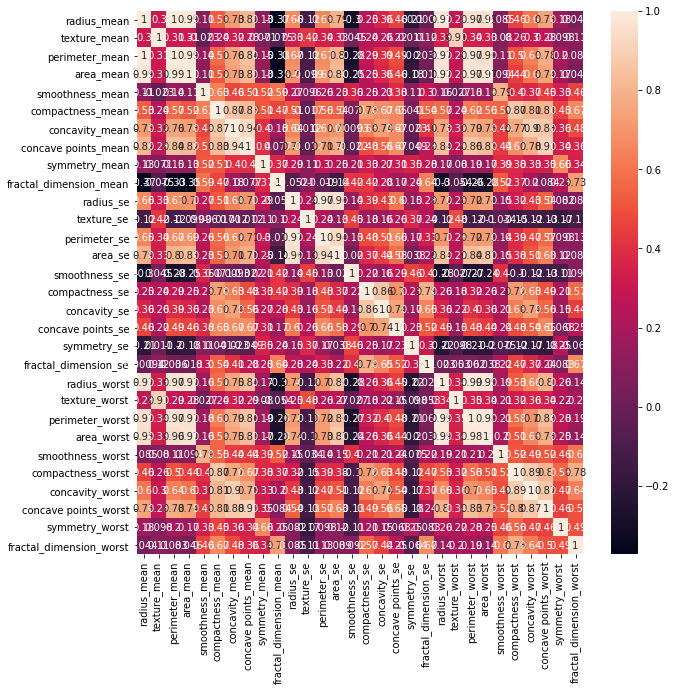

In [23]:
plt.figure(figsize=(10,10))
sns.heatmap(corr_feat,annot=True)

## Calculate the eigenvalues and eigenvectors from the correlation matrix

numpy has a convenient function to calculate this:

    eigenvalues, eigenvectors = np.linalg.eig(correlation_matrix)

In [57]:
# ANSWER
eigenvalues, eigenvectors = np.linalg.eig(corr_feat)

In [58]:
eigenvalues

array([1.36864542e+01, 5.21895213e+00, 2.86384026e+00, 1.90805022e+00,
       1.77001467e+00, 1.24439870e+00, 7.13220724e-01, 4.99699293e-01,
       3.86898672e-01, 3.36329066e-01, 3.05085771e-01, 2.68336290e-01,
       2.00676296e-01, 1.58557026e-01, 1.03983551e-01, 7.07364588e-02,
       5.18517676e-02, 4.07321581e-02, 3.57124976e-02, 3.24774800e-02,
       1.10984467e-04, 5.46995786e-04, 1.40854468e-03, 2.36123860e-02,
       1.96717265e-02, 1.89503101e-02, 1.41879147e-02, 6.67276428e-03,
       8.06785432e-03, 1.07632792e-02])

## Calculate and plot the explained variance

A useful measure is the **explained variance**, which is calculated from the eigenvalues. 

The explained variance tells us how much information (variance) is captured by each principal component.

$$ ExpVar_i = \bigg(\frac{eigenvalue_i}{\sum_j^n{eigenvalue_j}}\bigg) * 100$$

In [78]:
def calculate_cum_var_exp(eig_vals):
    '''
    Calculate Explained Variance from Eigenvalues
    
    Return a list or array containing the cumulative explained variance 
    '''
    var_score = 0 
    cum_var_exp=[]
    for val in eig_vals:
        var_score += (val/sum(eig_vals))*100
        cum_var_exp.append(var_score)
                      
    return cum_var_exp 

In [35]:
def plot_var_exp(eig_vals):
    
    cum_var_exp = calculate_cum_var_exp(eig_vals)
    
    plt.figure(figsize=(9,7))

    component_number = [i+1 for i in range(len(cum_var_exp))]

    plt.plot(component_number, cum_var_exp, lw=7)

    plt.axhline(y=0, linewidth=5, color='grey', ls='dashed')
    plt.axhline(y=100, linewidth=3, color='grey', ls='dashed')

    ax = plt.gca()
    ax.set_xlim([1,30])
    ax.set_ylim([-5,105])

    ax.set_ylabel('Cumulative Variance Explained (%)', fontsize=16)
    ax.set_xlabel('No. of Components', fontsize=16)

    for tick in ax.xaxis.get_major_ticks():
        tick.label.set_fontsize(12) 

    for tick in ax.yaxis.get_major_ticks():
        tick.label.set_fontsize(12) 

    ax.set_title('Component vs Cumulative Variance Explained\n', fontsize=20)

    plt.show()

In [47]:
calculate_cum_var_exp(eigenvalues)

[45.62151401962819,
 63.01802113378005,
 72.56415532768474,
 78.9243227177111,
 84.82437163268881,
 88.97236729341441,
 91.34976970802796,
 93.01543401748587,
 94.30509625778761,
 95.42619314600222,
 96.44314571499118,
 97.33760001380818,
 98.00652100006894,
 98.53504442133173,
 98.88165625939101,
 99.11744445549566,
 99.29028368099307,
 99.42605754125333,
 99.54509919980124,
 99.65335746632734,
 99.65372741455006,
 99.65555073383618,
 99.66024588278398,
 99.73895383618665,
 99.80452625776228,
 99.86769395822702,
 99.91498700737542,
 99.93722955496995,
 99.96412240268677,
 100.00000000000003]

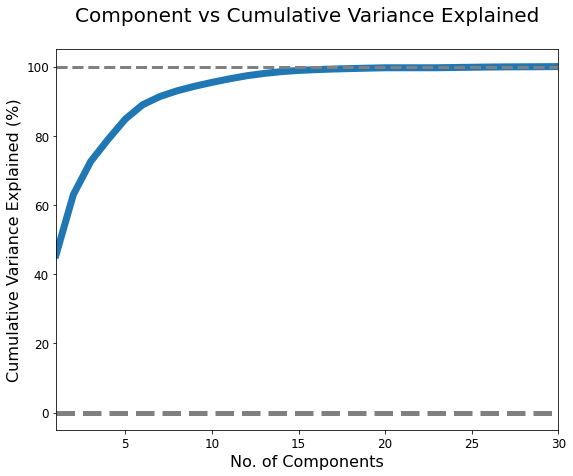

In [60]:
plot_var_exp(eigenvalues)

# Using sklearn For PCA

    from sklearn.decomposition import PCA
    
- Create an instance of PCA
- Fit X
- Plot the explained variance
- Define n_components
    - n_component
- Apply dimensionality reduction to X
    - transform
- Create PairPlot of PCA

In [68]:
# ANSWER
# Create an instance of PCA
pca = PCA(n_components=10, random_state=42)
# Fit Xs
pca.fit(bc_feat_ss)

PCA(n_components=10, random_state=42)

In [71]:
pca.singular_values_

array([82.30914185, 50.8269742 , 37.65104152, 30.73247236, 29.59995378,
       24.8188911 , 18.78947201, 15.72740125, 13.83888878, 12.9028248 ])

In [72]:
# ANSWER
# Plot explained_variance_
pca.explained_variance_

array([13.71415958,  5.22951681,  2.86963751,  1.91191267,  1.7735977 ,
        1.24691772,  0.71466449,  0.50071083,  0.38768187,  0.33700989])

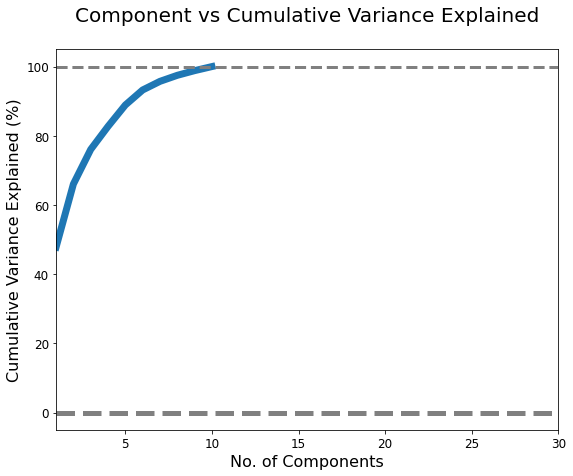

In [73]:
# ANSWER
# Apply dimensionality reduction to Xs using transform
plot_var_exp(pca.explained_variance_)

In [74]:
pca.transform(bc_feat_ss)

array([[ 3.9307305 , -4.12599478, -0.68682963, ..., -0.66412725,
        -0.95260032,  1.2872348 ],
       [ 7.97962098, -0.52583504, -0.22409021, ..., -0.14088896,
        -0.10645128, -0.12959698],
       [ 6.03851044, -1.66864315,  1.46194332, ..., -1.11264243,
         0.03471885,  1.19190129],
       ...,
       [ 9.33477181, -3.46928392,  3.53016761, ..., -0.01052341,
         1.30085328,  0.31639263],
       [ 5.72382395, -3.73531322,  3.62198224, ...,  1.01863731,
        -0.60799052, -0.1881195 ],
       [ 2.66080431, -1.81377283,  1.25373154, ..., -0.09037178,
         0.43210424,  0.28516605]])

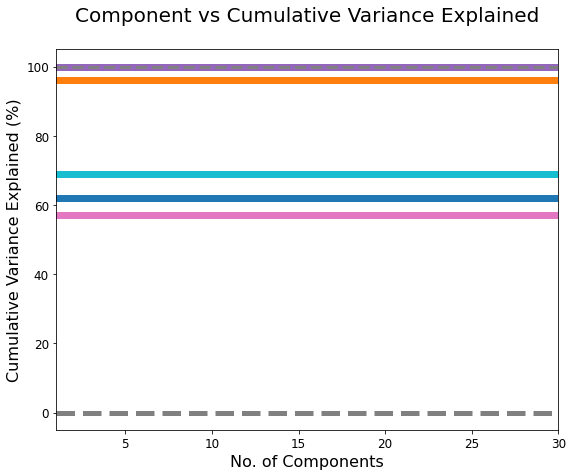

In [76]:
bc_pca = pd.DataFrame(pca.explained_variance_)
plot_var_exp(pca.transform(bc_feat_ss))

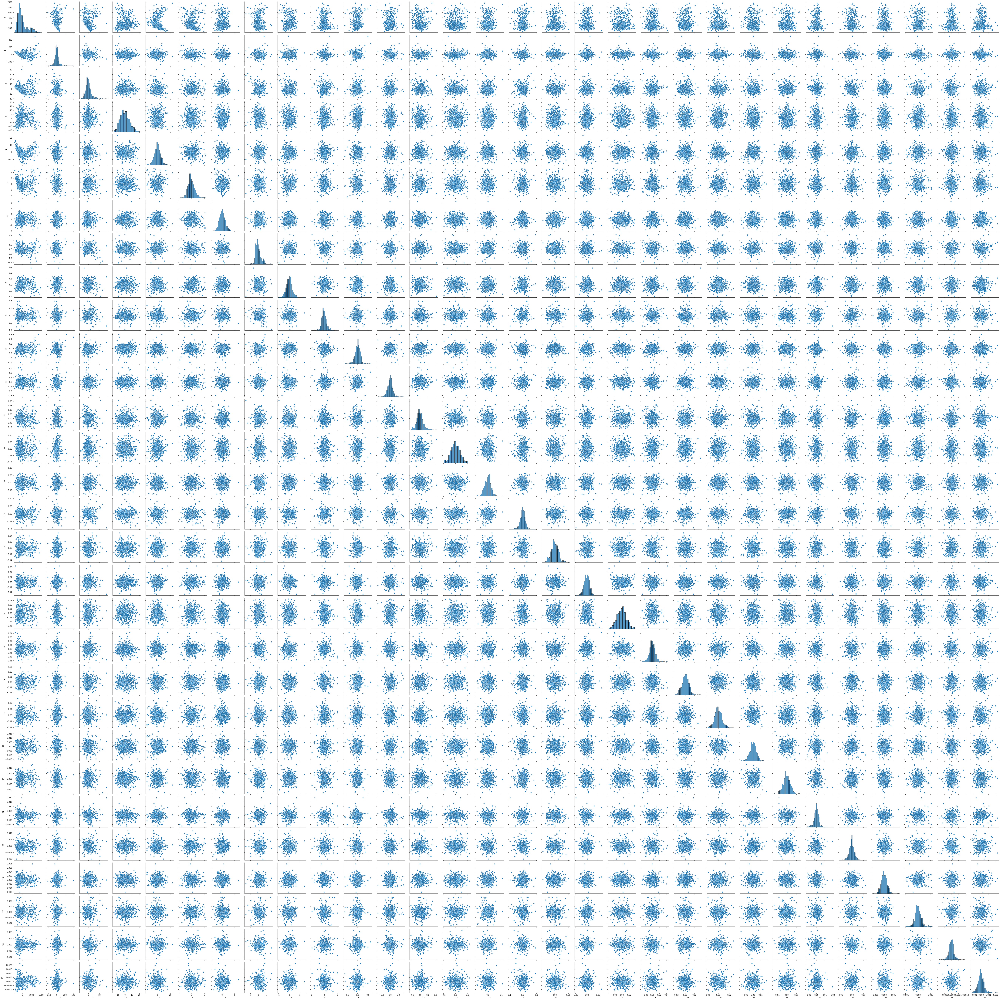

In [39]:
# ANSWER
# Create PairPlot of PCA
bc_pca = pd.DataFrame(pca.transform(bc_feat))
sns.pairplot(bc_pca)

## Split Data to 80/20 and Use PCA you gon in 6 as X

Split data 80/20 and Use KNN to find score.

In [49]:
# ANSWER
# Split Data
pca = PCA(n_components=10, random_state=42)
x_pca = pca.fit_transform(bc_feat_ss)
X_train, X_test, y_train, y_test = train_test_split(x_pca,bc['diagnosis'],random_state=42)

NameError: name 'bc_feat_ss' is not defined

In [ ]:
x = bc_feat
y = bc['diagosis']

In [50]:
# ANSWER
scoring = []
for k in range (1,len(X_train)):
    knn = KNeighborsClassifier(n_neighbors=k)
    mean = np.mean(cross_val_score(knn,X,y))
    scoring.append(mean)
scoring_ss = []
for k in range (1,len(X_train)):
    knn = KNeighborsClassifier(n_neighbors=k)
    mean = np.mean(cross_val_score(knn,x_pca,y))
    scoring_ss.append(mean)
    
plt.figure(figsiz = (7,5))
sns.color_palette('dark')
sns.lineplot(x=np.arrange(len(X_train)-1), y = scoring, label = 'Non-PCA')
sns.lineplot(x=np.arrange(len(X_train)-1), y =scoring_ss, label = 'PCA')

plt.title('PCA VS Non-PCA')
plt.ylabel('Accuracy Score')
plt.xlabel('No of Neighbours')

NameError: name 'X' is not defined

**References**

[Breast Cancer Wisconsin (Diagnostic) Data Set](https://www.kaggle.com/uciml/breast-cancer-wisconsin-data/downloads/breast-cancer-wisconsin-data.zip/2)

[Breast Cancer Machine Learning Prediction](https://gtraskas.github.io/post/breast_cancer/)

[Understanding PCA (Principal Component Analysis) with Python](https://towardsdatascience.com/dive-into-pca-principal-component-analysis-with-python-43ded13ead21)